# CSE 475 - Assignment 01
## Group Information

| Field | Details |
|-------------------------|-------------------------------------|
| **Group ID** | Group G |
| **Student 1 Name** | Aditya Debnath |
| **Student 1 ID** | 2022-2-60-124 |
| **Student 2 Name** | Umme Habiba |
| **Student 2 ID** | 2022-1-60-362 |
| **Student 3 Name** | Purnendu Bhowmik Shuvro |
| **Student 3 ID** | 2023-1-60-085 |
| **Student 4 Name** | Mujahida Nazmoon Naher |
| **Student 4 ID** | 2022-2-60-099 |
| **Notebook Type** | CNN Models / Transformer Models |
| **Dataset Source Name** | Chilli dataset |
| **Dataset Source Link** | https://data.mendeley.com/datasets/tf9dtfz9m6/2 |
| **Kaggle Dataset Path** | /kaggle/input/datasets/adityadebnathtirtha/chilli-dataset-2024/Chilli Dataset 2024 |
| **Submission Date** | 30 March 2026 |

## 📋 Table of Contents
1. [⚙️ Global Configuration](#config)
2. [📦 Setup & Imports](#setup)
3. [📊 Exploratory Data Analysis](#eda)
4. [🔧 Data Preprocessing, Augmentation & Split](#preprocessing)
5. [🏋️ Training Infrastructure](#training)
6. [🔵 CNN Models: MobileNetV3 · ResNeXt-50 · EfficientNet-B3](#cnn)
7. [📈 Evaluation & Comparison](#evaluation)
8. [🛡️ Robustness Analysis](#robustness)
9. [🔍 Error Analysis](#error)
10. [📝 Cross-Architecture Comparison Report](#report)


## ⚙️ Global Configuration <a id='config'></a>
**All hyperparameters, paths, seeds, and toggles are defined here. No hardcoded values appear elsewhere.**

In [1]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║           GLOBAL CONFIGURATION — EDIT THIS CELL ONLY         ║
# ╚══════════════════════════════════════════════════════════════════╝

import os, re

# ── Reproducibility ─────────────────────────────────────────────────
SEED = 42

# ── Dataset Path ────────────────────────────────────────────────────
BASE_DIR   = '/kaggle/input/datasets/adityadebnathtirtha/chilli-dataset-2024/Chilli Dataset 2024'
OUTPUT_DIR = '/kaggle/working'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Safe filename helper
def safe_name(s): return re.sub(r'[^A-Za-z0-9._-]+', '_', str(s)).strip('_')

# ── Data Split Ratios ───────────────────────────────────────────────
TRAIN_RATIO = 0.80   
VAL_RATIO   = 0.10   
TEST_RATIO  = 0.10   

# ── Image settings ──────────────────────────────────────────────────
IMG_SIZE   = 224     # Input resolution for all CNN models

# ── Training ────────────────────────────────────────────────────────
BATCH_SIZE      = 32    # Reduce to 16 if CUDA OOM
NUM_EPOCHS      = 30    
FREEZE_EPOCHS   = 15     # Epochs to train with backbone FROZEN (fine-tuning phase 1)
                         # After FREEZE_EPOCHS the backbone is unfrozen (phase 2)
EARLY_STOP_PAT  = 7     # Early-stopping patience (epochs without val improvement)

# ── Optimizer ───────────────────────────────────────────────────────
CNN_LR_HEAD     = 1e-3   # LR for classifier head during frozen phase
CNN_LR_FULL     = 3e-4   # LR for all params after unfreezing
WEIGHT_DECAY    = 1e-4
GRAD_CLIP       = 1.0

# ── Loss function ───────────────────────────────────────────────────
LABEL_SMOOTHING   = 0.1
USE_CLASS_WEIGHTS = True

# ── Regularization ──────────────────────────────────────────────────
DROPOUT_RATE   = 0.3
MIXUP_ALPHA    = 0.2   # 0 = disabled
RANDAUG_OPS    = 2
RANDAUG_MAG    = 9
RANDOM_ERASE_P = 0.1

# ── Robustness testing ──────────────────────────────────────────────
NOISE_LEVELS = [0.05, 0.15]
BLUR_KERNELS = [3, 9]

# ── CNN model IDs (timm) ────────────────────────────────────────────
CNN_MODELS = {
    'MobileNetV3-Large': 'mobilenetv3_large_100',
    'ResNeXt-50-32x4d' : 'resnext50_32x4d',
    'EfficientNet-B3'  : 'efficientnet_b3',
}

# ── Pretrained weights ──────────────────────────────────────────────
USE_PRETRAINED = True   # Fine-tuning requires pretrained=True

# ── Visualisation ───────────────────────────────────────────────────
COLORS  = ['#E74C3C','#F39C12','#8E44AD','#27AE60','#3498DB','#1ABC9C',
           '#E67E22','#2ECC71','#9B59B6','#34495E']
FIGDPI  = 120
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

print("✅ Global Configuration loaded.")
print(f"   Split → Train:{TRAIN_RATIO:.0%}  Val:{VAL_RATIO:.0%}  Test:{TEST_RATIO:.0%}")
print(f"   IMG_SIZE={IMG_SIZE}  BATCH={BATCH_SIZE}  EPOCHS={NUM_EPOCHS}")
print(f"   Fine-tune: freeze {FREEZE_EPOCHS} epochs → unfreeze all")
print(f"   Early-stop patience: {EARLY_STOP_PAT} epochs")
print(f"   USE_PRETRAINED={USE_PRETRAINED}")


✅ Global Configuration loaded.
   Split → Train:80%  Val:10%  Test:10%
   IMG_SIZE=224  BATCH=32  EPOCHS=30
   Fine-tune: freeze 15 epochs → unfreeze all
   Early-stop patience: 7 epochs
   USE_PRETRAINED=True


## 📦 Setup & Imports <a id='setup'></a>

In [2]:
# ── Install required packages ───────────────────────────────────────
!pip install timm grad-cam -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 59.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [3]:
import os, random, time, warnings, json
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from pathlib import Path
from PIL import Image

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
import torch.nn.functional as F
from torchvision import transforms
import timm

# Metrics
from sklearn.metrics import (
    classification_report, confusion_matrix,
    f1_score, roc_auc_score, roc_curve, auc,
    precision_recall_fscore_support
)
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split

# GradCAM
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ── Seed (must be defined BEFORE set_seed() call) ────────────────────
SEED = 42

# ── Device detection (CPU / GPU / TPU) — runs ONCE ───────────────────
def get_device():
    # 1️⃣ TPU check
    try:
        import torch_xla.core.xla_model as xm
        device = xm.xla_device()
        return device, 'tpu'
    except (ImportError, RuntimeError):
        pass

    # 2️⃣ GPU check
    if torch.cuda.is_available():
        return torch.device('cuda'), 'gpu'

    # 3️⃣ CPU fallback
    return torch.device('cpu'), 'cpu'

DEVICE, DEVICE_TYPE = get_device()

# ── AMP: only valid on GPU ────────────────────────────────────────────
AMP = (DEVICE_TYPE == 'gpu')

# ── Reproducibility ──────────────────────────────────────────────────
def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if DEVICE_TYPE == 'gpu':
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark     = False
    elif DEVICE_TYPE == 'tpu':
        import torch_xla.core.xla_model as xm
        xm.set_rng_state(seed, device=DEVICE)   # ✅ just seed, nothing else

set_seed()

# ── Summary ──────────────────────────────────────────────────────────
print(f"✅ Imports OK")
print(f"   PyTorch     : {torch.__version__}")
print(f"   timm        : {timm.__version__}")
print(f"   Device type : {DEVICE_TYPE.upper()}")
print(f"   Device      : {DEVICE}")
print(f"   AMP enabled : {AMP}")

if DEVICE_TYPE == 'gpu':
    print(f"   GPU name    : {torch.cuda.get_device_name(0)}")
    print(f"   VRAM        : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")

elif DEVICE_TYPE == 'tpu':
    import torch_xla.core.xla_model as xm
    print(f"   XLA device  : {xm.xla_device()}")
    # ✅ Safe fallback across all torch_xla versions
    try:
        cores = xm.xla_world_size()
    except AttributeError:
        try:
            import torch_xla.runtime as xr
            cores = xr.world_size()
        except Exception:
            cores = "N/A"
    print(f"   TPU cores   : {cores}")

else:
    print("   ⚠️  No accelerator found — training will be slow on CPU")

✅ Imports OK
   PyTorch     : 2.10.0+cu128
   timm        : 1.0.25
   Device type : GPU
   Device      : cuda
   AMP enabled : True
   GPU name    : Tesla T4
   VRAM        : 15.6 GB


## 📊 Exploratory Data Analysis <a id='eda'></a>

### 📌 Dataset Acknowledgement
> **Dataset Name**: *[Dataset name — chilli dataset]*  
> **Source**: *[Official URL — https://data.mendeley.com/datasets/tf9dtfz9m6/2]*  
> This dataset is used strictly for educational and research purposes within this course.

---
**Why EDA first?**
Understanding **class balance** determines whether we need weighted loss.  
Image **dimension statistics** guide our resize strategy.  
Analysing the **visual appearance** per class helps choose appropriate augmentations.


In [4]:
# ── Step 1: Discover all images from the dataset directory ─────────
EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}

def discover_all_images(base_dir):
    """
    Walks BASE_DIR recursively.
    Handles both flat: BASE_DIR/<class>/<img>
    and pre-split:     BASE_DIR/train/<class>/<img>  +  BASE_DIR/test/<class>/<img>
    Returns: list of (filepath, class_name)
    """
    base = Path(base_dir)
    records = []

    # Detect structure
    subdirs = [d for d in base.iterdir() if d.is_dir()]
    sub_names = {d.name for d in subdirs}

    # If the top-level folders look like split names, go one level deeper
    split_keywords = {'train','test','val','valid','validation'}
    if sub_names and sub_names.issubset(split_keywords | {'Train','Test','Val'}):
        for split_dir in subdirs:
            for class_dir in split_dir.iterdir():
                if class_dir.is_dir():
                    for f in class_dir.iterdir():
                        if f.suffix.lower() in EXTS:
                            records.append((str(f), class_dir.name))
    else:
        # Flat: BASE_DIR/<class>/<img>
        for class_dir in subdirs:
            for f in class_dir.iterdir():
                if f.suffix.lower() in EXTS:
                    records.append((str(f), class_dir.name))

    return records

all_records = discover_all_images(BASE_DIR)
print(f"✅ Total images discovered: {len(all_records)}")

# Build class index
CLASS_NAMES = sorted(set(r[1] for r in all_records))
NUM_CLASSES = len(CLASS_NAMES)
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}
short = [c[:15] for c in CLASS_NAMES]   # abbreviated labels for plots

print(f"\n📂 {NUM_CLASSES} classes found:")
for i, c in enumerate(CLASS_NAMES):
    cnt = sum(1 for r in all_records if r[1] == c)
    print(f"   [{i}] {c:<30} — {cnt} images")


✅ Total images discovered: 10987

📂 5 classes found:
   [0] cercospora                     — 2219 images
   [1] healthy                        — 2198 images
   [2] mites_and_trips                — 2507 images
   [3] nutritional                    — 2032 images
   [4] powdery mildew                 — 2031 images


In [5]:
# ── Step 2: Stratified 80 / 10 / 10 split ──────────────────────────
all_paths  = [r[0] for r in all_records]
all_labels = [CLASS_TO_IDX[r[1]] for r in all_records]

# First split: 80% train, 20% temp
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_paths, all_labels,
    test_size=(VAL_RATIO + TEST_RATIO),
    random_state=SEED,
    stratify=all_labels
)

# Second split: 50% of temp → val, 50% → test  (= 10% / 10% overall)
val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels,
    test_size=TEST_RATIO / (VAL_RATIO + TEST_RATIO),
    random_state=SEED,
    stratify=temp_labels
)

print(f"📊 Dataset split (stratified):")
print(f"   Train : {len(train_paths):>5} images  ({len(train_paths)/len(all_paths):.1%})")
print(f"   Val   : {len(val_paths):>5} images  ({len(val_paths)/len(all_paths):.1%})")
print(f"   Test  : {len(test_paths):>5} images  ({len(test_paths)/len(all_paths):.1%})")
print(f"   TOTAL : {len(all_paths):>5} images")


📊 Dataset split (stratified):
   Train :  8789 images  (80.0%)
   Val   :  1099 images  (10.0%)
   Test  :  1099 images  (10.0%)
   TOTAL : 10987 images


In [6]:
# ── Verify no data leakage between splits ────────────────────────────

train_set = set(train_paths)
val_set   = set(val_paths)
test_set  = set(test_paths)

overlap_train_test = train_set & test_set
overlap_train_val  = train_set & val_set
overlap_val_test   = val_set  & test_set

print(f"\nTrain ∩ Test : {len(overlap_train_test)}  ← must be 0")
print(f"Train ∩ Val  : {len(overlap_train_val)}   ← must be 0")
print(f"Val   ∩ Test : {len(overlap_val_test)}    ← must be 0")

if len(overlap_train_test) == 0 and len(overlap_train_val) == 0 and len(overlap_val_test) == 0:
    print("✅ No data leakage — splits are clean")
else:
    print("❌ DATA LEAKAGE DETECTED — splits overlap!")
    print("   Re-run your split cell with a fixed random seed")


Train ∩ Test : 0  ← must be 0
Train ∩ Val  : 0   ← must be 0
Val   ∩ Test : 0    ← must be 0
✅ No data leakage — splits are clean


In [7]:
# ── Step 3: Class-wise split statistics table ───────────────────────
split_stats = []
for cls in CLASS_NAMES:
    idx = CLASS_TO_IDX[cls]
    tr = sum(1 for l in train_labels if l == idx)
    vl = sum(1 for l in val_labels   if l == idx)
    te = sum(1 for l in test_labels  if l == idx)
    split_stats.append({'Class': cls, 'Train': tr, 'Val': vl, 'Test': te,
                         'Total': tr+vl+te})
stats_df = pd.DataFrame(split_stats)
stats_df['Train %'] = (stats_df['Train'] / stats_df['Train'].sum() * 100).round(1)
stats_df['Val %']   = (stats_df['Val']   / stats_df['Val'].sum()   * 100).round(1)
stats_df['Test %']  = (stats_df['Test']  / stats_df['Test'].sum()  * 100).round(1)

print(stats_df[['Class','Train','Val','Test','Total','Train %']].to_string(index=False))
imb = stats_df['Train'].min() / stats_df['Train'].max()
print(f"\nImbalance ratio (min/max train): {imb:.2f}  "
      f"{'⚠️  Use weighted loss' if imb < 0.7 else '✅ Balanced enough'}")


          Class  Train  Val  Test  Total  Train %
     cercospora   1775  222   222   2219     20.2
        healthy   1758  220   220   2198     20.0
mites_and_trips   2005  251   251   2507     22.8
    nutritional   1626  203   203   2032     18.5
 powdery mildew   1625  203   203   2031     18.5

Imbalance ratio (min/max train): 0.81  ✅ Balanced enough


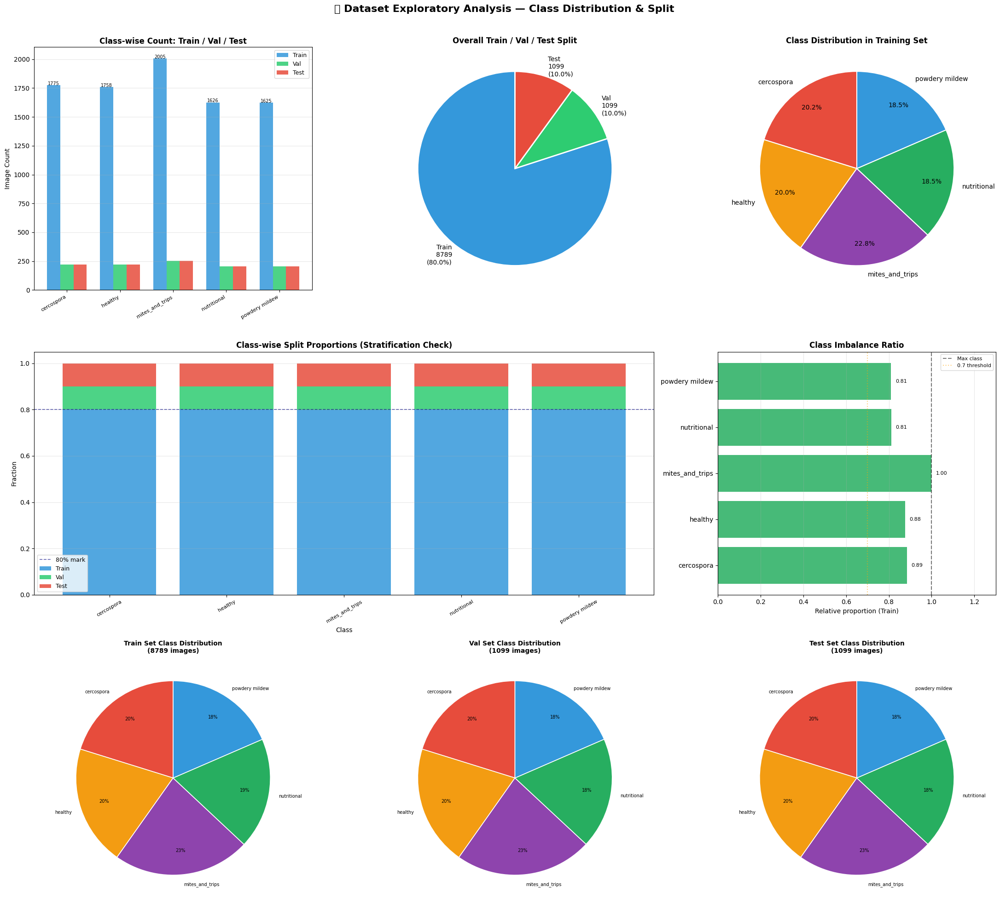

In [8]:
# ── Step 4: Rich EDA visualisations ────────────────────────────────
fig = plt.figure(figsize=(22, 20))
fig.suptitle('📊 Dataset Exploratory Analysis — Class Distribution & Split', 
             fontsize=16, fontweight='bold', y=0.98)

# ── Row 1: Grouped bar (train/val/test per class) ──────────────────
ax1 = fig.add_subplot(3, 3, 1)
x, w = np.arange(NUM_CLASSES), 0.25
bars_tr = ax1.bar(x - w,   stats_df['Train'], w, color='#3498DB', alpha=0.85, label='Train')
bars_vl = ax1.bar(x,       stats_df['Val'],   w, color='#2ECC71', alpha=0.85, label='Val')
bars_te = ax1.bar(x + w,   stats_df['Test'],  w, color='#E74C3C', alpha=0.85, label='Test')
ax1.set_xticks(x); ax1.set_xticklabels(short, rotation=30, ha='right', fontsize=8)
ax1.set_title('Class-wise Count: Train / Val / Test', fontweight='bold')
ax1.set_ylabel('Image Count'); ax1.legend(fontsize=9); ax1.grid(axis='y', alpha=0.3)
for b in bars_tr:
    ax1.text(b.get_x()+b.get_width()/2, b.get_height()+0.5,
             str(int(b.get_height())), ha='center', fontsize=7)

# ── Row 1: Pie chart — overall split ──────────────────────────────
ax2 = fig.add_subplot(3, 3, 2)
split_counts = [len(train_paths), len(val_paths), len(test_paths)]
split_labels = [f'Train\n{len(train_paths)}\n({len(train_paths)/len(all_paths):.1%})',
                f'Val\n{len(val_paths)}\n({len(val_paths)/len(all_paths):.1%})',
                f'Test\n{len(test_paths)}\n({len(test_paths)/len(all_paths):.1%})']
wedges, texts = ax2.pie(split_counts, labels=split_labels,
                         colors=['#3498DB','#2ECC71','#E74C3C'],
                         startangle=90, wedgeprops=dict(edgecolor='white', linewidth=2))
ax2.set_title('Overall Train / Val / Test Split', fontweight='bold')

# ── Row 1: Pie chart — class distribution in training set ─────────
ax3 = fig.add_subplot(3, 3, 3)
ccolors = [COLORS[i % len(COLORS)] for i in range(NUM_CLASSES)]
ax3.pie(stats_df['Train'], labels=short, colors=ccolors,
        autopct='%1.1f%%', startangle=90, pctdistance=0.78,
        wedgeprops=dict(edgecolor='white', linewidth=1.5))
ax3.set_title('Class Distribution in Training Set', fontweight='bold')

# ── Row 2: Stacked bar — class-wise split proportions ─────────────
ax4 = fig.add_subplot(3, 3, (4, 5))
totals = stats_df['Total'].values
tr_frac = stats_df['Train'].values / totals
vl_frac = stats_df['Val'].values   / totals
te_frac = stats_df['Test'].values  / totals
ax4.bar(short, tr_frac, color='#3498DB', alpha=0.85, label='Train')
ax4.bar(short, vl_frac, bottom=tr_frac, color='#2ECC71', alpha=0.85, label='Val')
ax4.bar(short, te_frac, bottom=tr_frac+vl_frac, color='#E74C3C', alpha=0.85, label='Test')
ax4.axhline(TRAIN_RATIO, color='navy', ls='--', lw=1.2, alpha=0.6, label=f'{TRAIN_RATIO:.0%} mark')
ax4.set_xlabel('Class'); ax4.set_ylabel('Fraction')
ax4.set_title('Class-wise Split Proportions (Stratification Check)', fontweight='bold')
ax4.tick_params(axis='x', rotation=30, labelsize=8)
ax4.legend(fontsize=9); ax4.grid(axis='y', alpha=0.3)

# ── Row 2: Imbalance ratio bar ─────────────────────────────────────
ax5 = fig.add_subplot(3, 3, 6)
ratio = stats_df['Train'].values / stats_df['Train'].max()
icolors = ['#27AE60' if r > 0.7 else ('#F39C12' if r > 0.4 else '#E74C3C') for r in ratio]
hbars = ax5.barh(short, ratio, color=icolors, alpha=0.85)
ax5.axvline(1.0, color='k', ls='--', alpha=0.5, label='Max class')
ax5.axvline(0.7, color='orange', ls=':', alpha=0.5, label='0.7 threshold')
ax5.set_xlabel('Relative proportion (Train)'); ax5.set_xlim(0, 1.3)
ax5.set_title('Class Imbalance Ratio', fontweight='bold')
ax5.legend(fontsize=8); ax5.grid(axis='x', alpha=0.3)
for bar, v in zip(hbars, ratio):
    ax5.text(bar.get_width()+0.02, bar.get_y()+bar.get_height()/2,
             f'{v:.2f}', va='center', fontsize=8)

# ── Row 3: 3 separate pie charts for Train / Val / Test ───────────
for col, (split_name, split_lbls) in enumerate([
        ('Train', train_labels), ('Val', val_labels), ('Test', test_labels)]):
    ax = fig.add_subplot(3, 3, 7 + col)
    counts_split = [sum(1 for l in split_lbls if l == i) for i in range(NUM_CLASSES)]
    ax.pie(counts_split, labels=short, colors=ccolors,
           autopct='%1.0f%%', startangle=90, pctdistance=0.75,
           textprops={'fontsize': 7},
           wedgeprops=dict(edgecolor='white', linewidth=1.2))
    ax.set_title(f'{split_name} Set Class Distribution\n({sum(counts_split)} images)',
                 fontweight='bold', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig(f'{OUTPUT_DIR}/eda_distribution.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


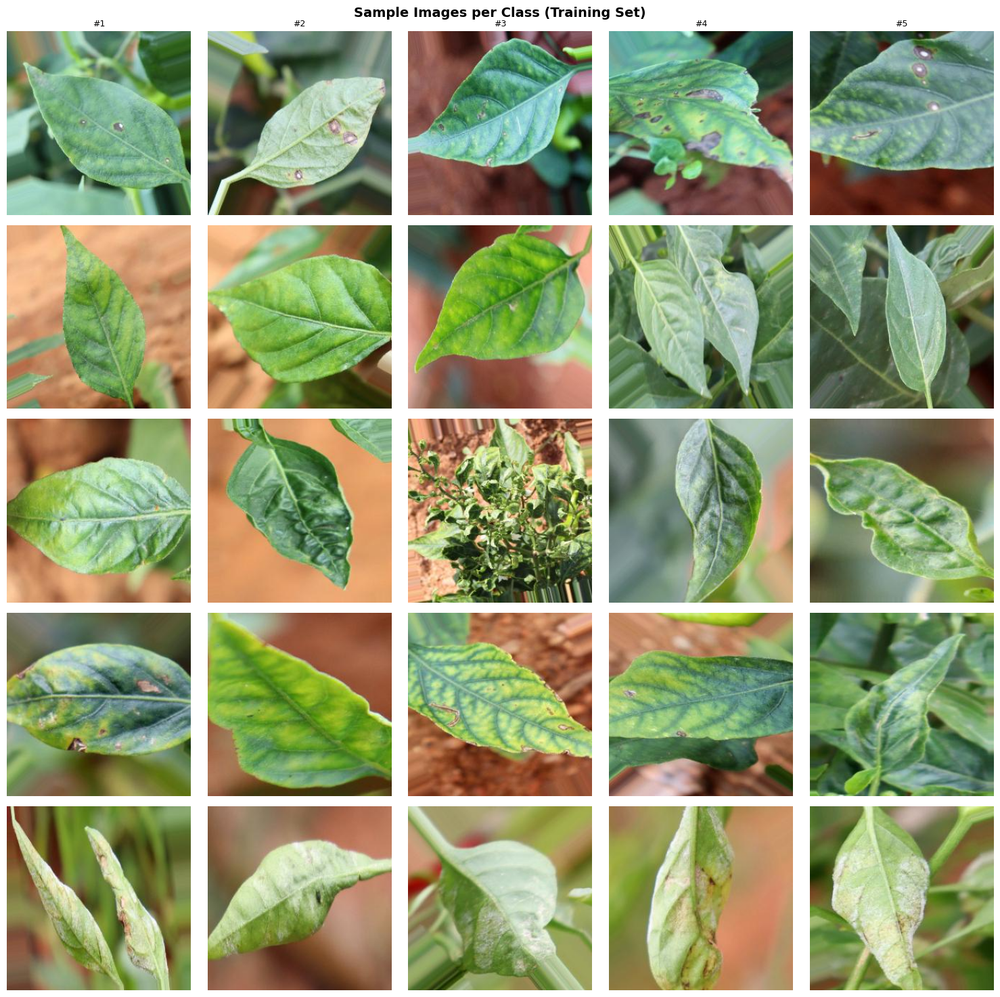

In [9]:
# ── Step 5: Sample images grid per class ────────────────────────────
def sample_imgs_from_list(paths, labels, class_idx, n=5):
    idxs = [i for i, l in enumerate(labels) if l == class_idx]
    chosen = random.sample(idxs, min(n, len(idxs)))
    return [paths[i] for i in chosen]

N_SAMPLES = 5
fig, axes = plt.subplots(NUM_CLASSES, N_SAMPLES,
                          figsize=(N_SAMPLES * 3, NUM_CLASSES * 3))
if NUM_CLASSES == 1: axes = [axes]
fig.suptitle('Sample Images per Class (Training Set)', fontsize=14, fontweight='bold')

for r, cls in enumerate(CLASS_NAMES):
    row_axes = axes[r] if NUM_CLASSES > 1 else axes
    for c, p in enumerate(sample_imgs_from_list(train_paths, train_labels,
                                                 CLASS_TO_IDX[cls], N_SAMPLES)):
        row_axes[c].imshow(Image.open(p).convert('RGB'))
        row_axes[c].axis('off')
        if c == 0:
            row_axes[c].set_ylabel(cls[:20], fontsize=8, labelpad=55, rotation=0,
                                    ha='right', va='center',
                                    color=COLORS[r % len(COLORS)], fontweight='bold')
        if r == 0:
            row_axes[c].set_title(f'#{c+1}', fontsize=9)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/sample_images.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


⏳ Analysing image properties (sampling up to 25 images/class)...


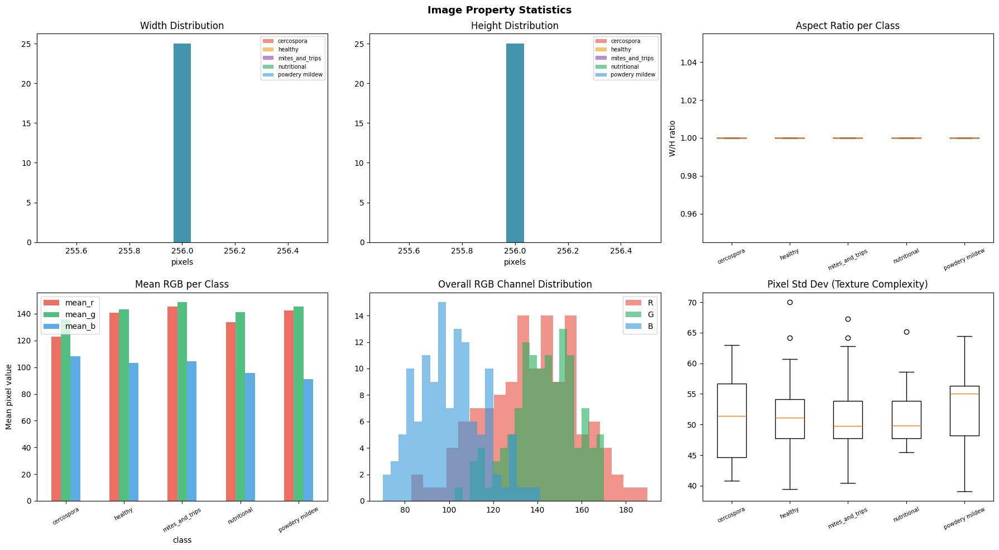


Avg resolution: 256 × 256 px
Aspect ratio range: 1.00 – 1.00

💡 EDA Insights:
   • All images will be resized to 224×224 for uniform input
   • Imbalance ratio 0.81 → relatively balanced
   • Patch size 16×16 → 14×14 = 196 tokens for ViT


In [10]:
# ── Step 6: Image dimension & pixel statistics ───────────────────────
print("⏳ Analysing image properties (sampling up to 25 images/class)...")
records_dim = []
for cls in CLASS_NAMES:
    sample_p = sample_imgs_from_list(train_paths, train_labels, CLASS_TO_IDX[cls], 25)
    for p in sample_p:
        try:
            img = Image.open(p).convert('RGB')
            arr = np.array(img)
            records_dim.append({
                'class': cls,
                'width': img.size[0], 'height': img.size[1],
                'aspect': img.size[0] / img.size[1],
                'mean_r': arr[:,:,0].mean(), 'mean_g': arr[:,:,1].mean(),
                'mean_b': arr[:,:,2].mean(), 'std': arr.std()
            })
        except Exception: pass

props = pd.DataFrame(records_dim)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Image Property Statistics', fontsize=13, fontweight='bold')

for i, cls in enumerate(CLASS_NAMES):
    sub = props[props['class'] == cls]
    axes[0,0].hist(sub['width'],  alpha=0.6, color=COLORS[i%len(COLORS)],
                   label=short[i], bins=15)
    axes[0,1].hist(sub['height'], alpha=0.6, color=COLORS[i%len(COLORS)],
                   label=short[i], bins=15)

axes[0,0].set_title('Width Distribution');  axes[0,0].legend(fontsize=7); axes[0,0].set_xlabel('pixels')
axes[0,1].set_title('Height Distribution'); axes[0,1].legend(fontsize=7); axes[0,1].set_xlabel('pixels')

axes[0,2].boxplot([props[props['class']==c]['aspect'].values for c in CLASS_NAMES], labels=short)
axes[0,2].set_title('Aspect Ratio per Class'); axes[0,2].tick_params(axis='x', rotation=25, labelsize=7)
axes[0,2].set_ylabel('W/H ratio')

props.groupby('class')[['mean_r','mean_g','mean_b']].mean().plot(
    kind='bar', ax=axes[1,0], color=['#E74C3C','#27AE60','#3498DB'], alpha=0.8)
axes[1,0].set_title('Mean RGB per Class'); axes[1,0].tick_params(axis='x', rotation=30, labelsize=7)
axes[1,0].set_ylabel('Mean pixel value')

for i, (ch, col) in enumerate(zip(['mean_r','mean_g','mean_b'],
                                    ['#E74C3C','#27AE60','#3498DB'])):
    axes[1,1].hist(props[ch], alpha=0.6, color=col, label=['R','G','B'][i], bins=20)
axes[1,1].set_title('Overall RGB Channel Distribution'); axes[1,1].legend()

axes[1,2].boxplot([props[props['class']==c]['std'].values for c in CLASS_NAMES], labels=short)
axes[1,2].set_title('Pixel Std Dev (Texture Complexity)'); axes[1,2].tick_params(axis='x', rotation=25, labelsize=7)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/image_properties.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()

print(f"\nAvg resolution: {props['width'].mean():.0f} × {props['height'].mean():.0f} px")
print(f"Aspect ratio range: {props['aspect'].min():.2f} – {props['aspect'].max():.2f}")
print(f"\n💡 EDA Insights:")
print(f"   • All images will be resized to {IMG_SIZE}×{IMG_SIZE} for uniform input")
print(f"   • Imbalance ratio {stats_df['Train'].min()/stats_df['Train'].max():.2f} → "
      f"{'weighted loss recommended' if stats_df['Train'].min()/stats_df['Train'].max() < 0.7 else 'relatively balanced'}")
print(f"   • Patch size 16×16 → {IMG_SIZE//16}×{IMG_SIZE//16} = {(IMG_SIZE//16)**2} tokens for ViT")


## 🔧 Data Preprocessing, Augmentation & Split <a id='preprocessing'></a>

**Fine-tuning augmentation strategy for CNNs:**

| Transform | Justification |
|-----------|--------------|
| `RandomResizedCrop(224)` | Scale & aspect-ratio invariance |
| `RandomHorizontalFlip` | Reflection symmetry present in most image datasets |
| `ColorJitter` | Illumination/camera variation |
| `RandAugment` | Auto-policy providing diverse augmentations without manual tuning |
| `RandomErasing` | Forces model to use distributed features, not single discriminative patch |
| `MixUp (α=0.2)` | Regularises by interpolating pairs → smoother decision boundaries |

**ImageNet normalisation** is required because the pretrained backbone was trained on ImageNet statistics.


In [11]:
# ── Custom Dataset wrapping paths + labels ───────────────────────────
class PathDataset(Dataset):
    """Lightweight dataset from lists of file paths and integer labels."""
    def __init__(self, paths, labels, transform=None):
        self.paths     = paths
        self.labels    = labels
        self.transform = transform

    def __len__(self): return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, self.labels[idx]


# ── Augmentation transforms ──────────────────────────────────────────
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1),
    transforms.RandAugment(num_ops=RANDAUG_OPS, magnitude=RANDAUG_MAG),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    transforms.RandomErasing(p=RANDOM_ERASE_P, scale=(0.02, 0.2)),
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])


# ── Build datasets ───────────────────────────────────────────────────
train_dataset = PathDataset(train_paths, train_labels, transform=train_transform)
val_dataset   = PathDataset(val_paths,   val_labels,   transform=val_transform)
test_dataset  = PathDataset(test_paths,  test_labels,  transform=val_transform)

# ── DataLoaders ──────────────────────────────────────────────────────
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                           num_workers=2, pin_memory=True, drop_last=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=2, pin_memory=True)

# ── Class weights for imbalance ──────────────────────────────────────
counts_arr  = np.array([sum(1 for l in train_labels if l == i)
                         for i in range(NUM_CLASSES)], dtype=float)
class_weights = (1.0 / counts_arr) / (1.0 / counts_arr).sum() * NUM_CLASSES
CW_TENSOR     = torch.FloatTensor(class_weights).to(DEVICE)

print(f"✅ Train  : {len(train_dataset):>5} images | {len(train_loader):>3} batches")
print(f"✅ Val    : {len(val_dataset):>5} images | {len(val_loader):>3} batches")
print(f"✅ Test   : {len(test_dataset):>5} images | {len(test_loader):>3} batches")
print(f"⚖️  Class weights: {class_weights.round(3)}")


✅ Train  :  8789 images | 274 batches
✅ Val    :  1099 images |  35 batches
✅ Test   :  1099 images |  35 batches
⚖️  Class weights: [0.984 0.994 0.872 1.075 1.075]


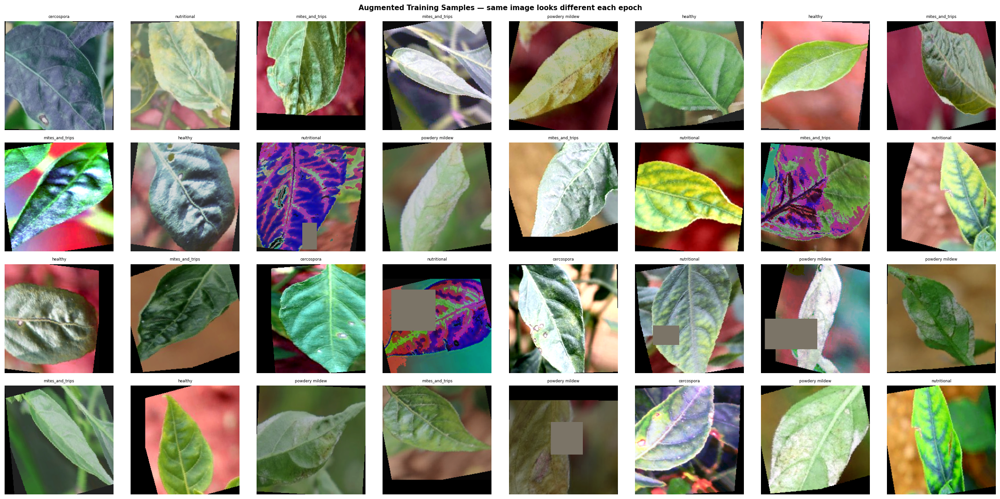

In [12]:
# ── MixUp helper ────────────────────────────────────────────────────
def mixup_batch(images, labels, alpha=MIXUP_ALPHA, num_classes=NUM_CLASSES):
    """Pure torch implementation to prevent CUDA Accelerator errors."""
    if alpha <= 0:
        return images, F.one_hot(labels, num_classes).float()

    # Use torch's Beta distribution instead of numpy
    # This keeps 'lam' as a tensor on the same device as the images
    dist = torch.distributions.Beta(alpha, alpha)
    lam = dist.sample().to(images.device)
    
    idx = torch.randperm(images.size(0)).to(images.device)

    # Blend images
    mixed_imgs = lam * images + (1 - lam) * images[idx]
    
    # Generate soft labels
    y_a = F.one_hot(labels, num_classes).float()
    y_b = F.one_hot(labels[idx], num_classes).float()
    mixed_labels = lam * y_a + (1 - lam) * y_b
    
    return mixed_imgs, mixed_labels

# ── Visualise augmented samples ──────────────────────────────────────
def denorm(t):
    m = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    s = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(t * s + m, 0, 1)

imgs_b, lbls_b = next(iter(train_loader))
fig, axes = plt.subplots(4, 8, figsize=(22, 11))
fig.suptitle('Augmented Training Samples — same image looks different each epoch',
             fontsize=11, fontweight='bold')
for idx in range(min(32, len(imgs_b))):
    r, c = idx // 8, idx % 8
    axes[r,c].imshow(denorm(imgs_b[idx]).permute(1,2,0).numpy())
    axes[r,c].set_title(short[lbls_b[idx].item()], fontsize=6)
    axes[r,c].axis('off')
plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/augmented_samples.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


## 🏋️ Training Infrastructure <a id='training'></a>

This section implements a **two-phase fine-tuning** strategy:
- **Phase 1** (first `FREEZE_EPOCHS` epochs): Backbone frozen, only the classification head trains with a higher LR (`CNN_LR_HEAD`). This prevents catastrophic forgetting of ImageNet features early on.
- **Phase 2** (remaining epochs): Entire network unfreezes and trains end-to-end with a smaller LR (`CNN_LR_FULL`) + CosineAnnealing schedule.

**Early stopping** monitors validation accuracy and halts training when no improvement is seen for `EARLY_STOP_PAT` consecutive epochs, saving the best checkpoint automatically.

In [13]:
# ── Loss function ────────────────────────────────────────────────────
def build_criterion():
    return nn.CrossEntropyLoss(
        weight=CW_TENSOR if USE_CLASS_WEIGHTS else None,
        label_smoothing=LABEL_SMOOTHING
    )

# ── Soft-label loss for MixUp ────────────────────────────────────────
def soft_cross_entropy(logits, soft_targets):
    """Cross-entropy that accepts soft (non-integer) label distributions."""    
    log_prob = F.log_softmax(logits, dim=1)
    if USE_CLASS_WEIGHTS:
        w = CW_TENSOR / CW_TENSOR.sum()
        loss = -(soft_targets * log_prob * w.unsqueeze(0)).sum(dim=1).mean()
    else:
        loss = -(soft_targets * log_prob).sum(dim=1).mean()
    return loss


# ── One training epoch ───────────────────────────────────────────────
# Improved train_epoch logic (Page 21)
def train_epoch(model, loader, criterion, optimizer, scaler, use_mixup=True):
    model.train()
    loss_sum, correct, total = 0.0, 0, 0
    
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        
        # Combined AMP and Optimized metrics pass
        with torch.cuda.amp.autocast(enabled=AMP):
            if use_mixup and MIXUP_ALPHA > 0:
                # Get mixed data
                mixed_imgs, soft_labels = mixup_batch(images, labels)
                logits = model(mixed_imgs)
                loss = soft_cross_entropy(logits, soft_labels)
                # Accuracy is traditionally calculated on un-mixed labels for reporting
                with torch.no_grad():
                    clean_logits = model(images) 
                    preds = clean_logits.argmax(1)
            else:
                logits = model(images)
                loss = criterion(logits, labels)
                preds = logits.argmax(1)

        # Gradient Scaling
        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
        scaler.step(optimizer)
        scaler.update()
        
        # Accumulate metrics using only 'preds' to avoid calling model() again
        loss_sum += loss.item()
        correct += preds.eq(labels).sum().item()
        total += labels.size(0)
        
    return loss_sum / len(loader), 100.0 * correct / total


# ── Evaluation ───────────────────────────────────────────────────────
@torch.no_grad()
def evaluate(model, loader, criterion=None):
    """Returns (loss, accuracy, preds_array, labels_array, probs_array)."""    
    model.eval()
    if criterion is None: criterion = nn.CrossEntropyLoss()
    loss_sum, correct, total = 0.0, 0, 0
    all_preds, all_labels, all_probs = [], [], []
    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        out    = model(images)
        probs  = F.softmax(out, dim=1)
        preds  = out.argmax(1)
        loss_sum += criterion(out, labels).item()
        correct  += preds.eq(labels).sum().item()
        total    += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())
    return (loss_sum / len(loader), 100.0 * correct / total,
            np.array(all_preds), np.array(all_labels), np.array(all_probs))


# ── Two-phase fine-tuning training loop ─────────────────────────────
def train_model(model, name, backbone_params=None, head_params=None,
                lr_head=CNN_LR_HEAD, lr_full=CNN_LR_FULL, epochs=NUM_EPOCHS):

    model = model.to(DEVICE)
    criterion = build_criterion()
    scaler = torch.cuda.amp.GradScaler(enabled=AMP)

    if backbone_params is not None and head_params is not None:
        for p in backbone_params: p.requires_grad_(False)
        optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=lr_head, weight_decay=WEIGHT_DECAY)
        phase1_epochs = min(FREEZE_EPOCHS, epochs)
    else:
        phase1_epochs = 0
        optimizer = optim.AdamW(model.parameters(), lr=lr_full,
                                weight_decay=WEIGHT_DECAY)

    history = {'train_loss':[], 'train_acc':[], 'val_loss':[], 'val_acc':[], 'lr':[]}
    best_val_acc, patience_ctr, best_epoch = 0.0, 0, 0
    scheduler  = None
    ckpt_path  = f'{OUTPUT_DIR}/{safe_name(name)}_best.pth'
    interrupted = False                           # ✅ track interrupt state

    print(f"\n{'='*70}")
    print(f" Training: {name}  |  "
          f"{sum(p.numel() for p in model.parameters())/1e6:.1f}M params")
    print(f"{'='*70}")
    print(f"  Phase 1 (frozen backbone): {phase1_epochs} epochs  @ LR={lr_head:.0e}")
    print(f"  Phase 2 (full fine-tune) : {epochs-phase1_epochs} epochs  @ LR={lr_full:.0e}")
    print(f"  Early-stop patience: {EARLY_STOP_PAT}  |  Grad-clip: {GRAD_CLIP}")
    print(f"{'─'*70}")
    print(f"{'Ep':>4} | {'Ph':>2} | {'TrLoss':>8} | {'TrAcc':>7} | "
          f"{'VaLoss':>8} | {'VaAcc':>7} | {'LR':>9}")
    print(f"{'─'*70}")

    try:
        for ep in range(1, epochs + 1):

            if ep == phase1_epochs + 1 and backbone_params is not None:
                for p in backbone_params: p.requires_grad_(True)
                optimizer = optim.AdamW(model.parameters(), lr=lr_full,
                                        weight_decay=WEIGHT_DECAY)
                remaining = epochs - phase1_epochs
                scheduler = optim.lr_scheduler.CosineAnnealingLR(
                    optimizer, T_max=remaining, eta_min=lr_full * 0.01)
                print(f"  🔓 Epoch {ep}: Backbone unfrozen — full fine-tune")

            t0 = time.time()
            tr_loss, tr_acc = train_epoch(model, train_loader, criterion,
                                          optimizer, scaler)
            va_loss, va_acc, _, _, _ = evaluate(model, val_loader, criterion)
            if scheduler: scheduler.step()

            history['train_loss'].append(tr_loss)
            history['train_acc'].append(tr_acc)
            history['val_loss'].append(va_loss)
            history['val_acc'].append(va_acc)
            history['lr'].append(optimizer.param_groups[0]['lr'])

            phase = '1' if ep <= phase1_epochs else '2'
            star  = ' ⭐' if va_acc > best_val_acc else ''
            print(f"{ep:>4} | {phase:>2} | {tr_loss:>8.4f} | {tr_acc:>6.2f}% | "
                  f"{va_loss:>8.4f} | {va_acc:>6.2f}%{star} | "
                  f"{optimizer.param_groups[0]['lr']:.2e}  [{time.time()-t0:.1f}s]")

            if va_acc > best_val_acc:
                best_val_acc = va_acc
                best_epoch   = ep
                torch.save(model.state_dict(), ckpt_path)
                patience_ctr = 0
            else:
                patience_ctr += 1
                if patience_ctr >= EARLY_STOP_PAT and ep > FREEZE_EPOCHS:
                    print(f"\n  ⏹️  Early stop at epoch {ep} "
                          f"(best: epoch {best_epoch}, {best_val_acc:.2f}%)")
                    break

    except KeyboardInterrupt:
        interrupted = True
        print(f"\n  ⚠️  Interrupted at epoch {ep}.")

    # ── Always reload best & return ───────────────────────────────────
    if best_val_acc > 0 and os.path.exists(ckpt_path):
        model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
        if interrupted:
            print(f"  💾  Reloaded best checkpoint "
                  f"(epoch {best_epoch}, {best_val_acc:.2f}%)")
    else:
        print("  ⚠️  No checkpoint saved — returning current weights.")

    print(f"\n✅ {name} — Best val acc: {best_val_acc:.2f}%  (epoch {best_epoch})")
    return model, history, best_val_acc           # ✅ ALWAYS returns a 3-tuple


# ── Plot training curves ─────────────────────────────────────────────
def plot_history(history, name, freeze_ep=FREEZE_EPOCHS):
    ep = range(1, len(history['val_acc']) + 1)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'{name} — Training History', fontsize=12, fontweight='bold')

    for ax in axes:
        if freeze_ep > 0 and freeze_ep < len(list(ep)):
            ax.axvline(freeze_ep + 0.5, color='purple', ls='--', alpha=0.5,
                       label='Backbone unfrozen')

    axes[0].plot(ep, history['train_loss'], 'b-o', ms=3, label='Train')
    axes[0].plot(ep, history['val_loss'],   'r-o', ms=3, label='Val')
    axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')

    axes[1].plot(ep, history['train_acc'], 'b-o', ms=3, label='Train')
    axes[1].plot(ep, history['val_acc'],   'r-o', ms=3, label='Val')
    best_ep = np.argmax(history['val_acc']) + 1
    axes[1].axvline(best_ep, color='green', ls=':', alpha=0.6, label=f'Best epoch {best_ep}')
    axes[1].set_title('Accuracy (%)'); axes[1].legend(); axes[1].grid(alpha=0.3)
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy (%)')

    axes[2].plot(ep, history['lr'], 'g-o', ms=3)
    axes[2].set_title('Learning Rate Schedule'); axes[2].grid(alpha=0.3)
    axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('LR'); axes[2].set_yscale('log')

    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/{safe_name(name)}_history.png', dpi=FIGDPI, bbox_inches='tight')
    plt.show()

print("✅ Training infrastructure defined.")
print("   ✔ Two-phase fine-tuning (freeze → unfreeze)")
print("   ✔ MixUp augmentation")
print("   ✔ Early stopping")
print("   ✔ CosineAnnealing LR schedule")
print("   ✔ Gradient clipping")


✅ Training infrastructure defined.
   ✔ Two-phase fine-tuning (freeze → unfreeze)
   ✔ MixUp augmentation
   ✔ Early stopping
   ✔ CosineAnnealing LR schedule
   ✔ Gradient clipping


## 🔵 CNN Models: MobileNetV3 · ResNeXt-50 · EfficientNet-B3 <a id='cnn'></a>

| Model | Year | Params | Core Architecture |
|-------|------|--------|------------------|
| **MobileNetV3-Large** | 2019 | ~5.4M | Depthwise separable conv + SE + Hard-Swish, NAS-optimised for mobile |
| **ResNeXt-50-32×4d** | 2017 | ~25M | ResNet + grouped convolutions (cardinality=32 as new scaling dimension) |
| **EfficientNet-B3** | 2019 | ~12M | NAS baseline + compound scaling of depth/width/resolution |

All three use **pretrained ImageNet weights** via `timm` and undergo two-phase fine-tuning.


  MODEL 1: MobileNetV3-Large
  Architecture: Depthwise separable conv + SE + Hard-Swish
  Designed for: Mobile/edge deployment (5.4M params)


model.safetensors:   0%|          | 0.00/22.1M [00:00<?, ?B/s]

Parameters: 4.21M total | 4.21M trainable
Classifier head: Linear(in_features=1280, out_features=5, bias=True)

 Training: MobileNetV3-Large  |  4.2M params
  Phase 1 (frozen backbone): 15 epochs  @ LR=1e-03
  Phase 2 (full fine-tune) : 15 epochs  @ LR=3e-04
  Early-stop patience: 7  |  Grad-clip: 1.0
──────────────────────────────────────────────────────────────────────
  Ep | Ph |   TrLoss |   TrAcc |   VaLoss |   VaAcc |        LR
──────────────────────────────────────────────────────────────────────
   1 |  1 |   0.5520 |  34.56% |   1.9551 |  45.40% ⭐ | 1.00e-03  [97.1s]
   2 |  1 |   0.3734 |  53.82% |   1.4642 |  61.42% ⭐ | 1.00e-03  [47.6s]
   3 |  1 |   0.3116 |  61.63% |   1.2412 |  70.52% ⭐ | 1.00e-03  [47.7s]
   4 |  1 |   0.2843 |  65.45% |   1.1653 |  72.43% ⭐ | 1.00e-03  [46.9s]
   5 |  1 |   0.2684 |  68.27% |   1.1079 |  74.98% ⭐ | 1.00e-03  [46.4s]
   6 |  1 |   0.2530 |  69.66% |   0.9904 |  78.80% ⭐ | 1.00e-03  [46.8s]
   7 |  1 |   0.2378 |  71.22% |   0.9887 |  79

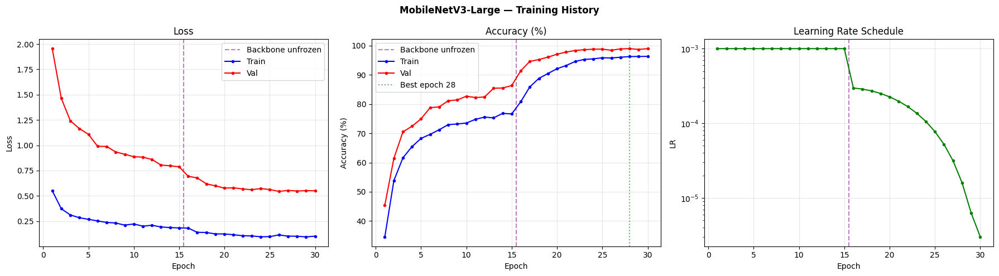

In [14]:
# ── Helper: get backbone params vs head params ───────────────────────
def get_param_groups(model, model_key):
    """Returns (backbone_params, head_params) for two-phase fine-tuning."""    
    if 'MobileNetV3' in model_key or 'mobilenet' in model_key.lower():
        head_names = {'classifier', 'head', 'fc'}
    elif 'ResNeXt' in model_key or 'resnext' in model_key.lower():
        head_names = {'fc', 'head'}
    elif 'EfficientNet' in model_key or 'efficientnet' in model_key.lower():
        head_names = {'classifier', 'head', 'fc'}
    else:
        head_names = {'classifier', 'head', 'fc'}

    backbone_params, head_params = [], []
    for n, p in model.named_parameters():
        root = n.split('.')[0]
        if root in head_names:
            head_params.append(p)
        else:
            backbone_params.append(p)
    return backbone_params, head_params


# ── Model 1: MobileNetV3-Large ───────────────────────────────────────
print("="*60)
print("  MODEL 1: MobileNetV3-Large")
print("  Architecture: Depthwise separable conv + SE + Hard-Swish")
print("  Designed for: Mobile/edge deployment (5.4M params)")
print("="*60)

mobilenet = timm.create_model(
    CNN_MODELS['MobileNetV3-Large'],
    pretrained=USE_PRETRAINED,
    num_classes=NUM_CLASSES,
    drop_rate=DROPOUT_RATE
)
total_p = sum(p.numel() for p in mobilenet.parameters())
train_p = sum(p.numel() for p in mobilenet.parameters() if p.requires_grad)
print(f"Parameters: {total_p/1e6:.2f}M total | {train_p/1e6:.2f}M trainable")
print(f"Classifier head: {mobilenet.classifier}")

mob_bb, mob_hd = get_param_groups(mobilenet, 'MobileNetV3')
mobilenet, hist_mob, best_mob = train_model(
    mobilenet, 'MobileNetV3-Large', mob_bb, mob_hd)
plot_history(hist_mob, 'MobileNetV3-Large')


  MODEL 2: ResNeXt-50-32x4d
  Architecture: ResNet + grouped convolutions (cardinality=32)
  Key idea: 32 groups × 4 channels — richer feature diversity


model.safetensors:   0%|          | 0.00/100M [00:00<?, ?B/s]

Parameters: 22.99M total
Classifier head: Linear(in_features=2048, out_features=5, bias=True)

 Training: ResNeXt-50-32x4d  |  23.0M params
  Phase 1 (frozen backbone): 15 epochs  @ LR=1e-03
  Phase 2 (full fine-tune) : 15 epochs  @ LR=3e-04
  Early-stop patience: 7  |  Grad-clip: 1.0
──────────────────────────────────────────────────────────────────────
  Ep | Ph |   TrLoss |   TrAcc |   VaLoss |   VaAcc |        LR
──────────────────────────────────────────────────────────────────────
   1 |  1 |   0.2698 |  54.87% |   1.1784 |  71.88% ⭐ | 1.00e-03  [54.4s]
   2 |  1 |   0.2186 |  67.78% |   1.0115 |  76.52% ⭐ | 1.00e-03  [54.8s]
   3 |  1 |   0.2042 |  69.49% |   0.9364 |  79.53% ⭐ | 1.00e-03  [54.3s]
   4 |  1 |   0.1950 |  70.45% |   0.9260 |  78.62% | 1.00e-03  [54.7s]
   5 |  1 |   0.1900 |  71.33% |   0.8801 |  81.16% ⭐ | 1.00e-03  [54.9s]
   6 |  1 |   0.1856 |  72.82% |   0.8572 |  82.44% ⭐ | 1.00e-03  [54.1s]
   7 |  1 |   0.1813 |  73.24% |   0.8380 |  82.53% ⭐ | 1.00e-03  

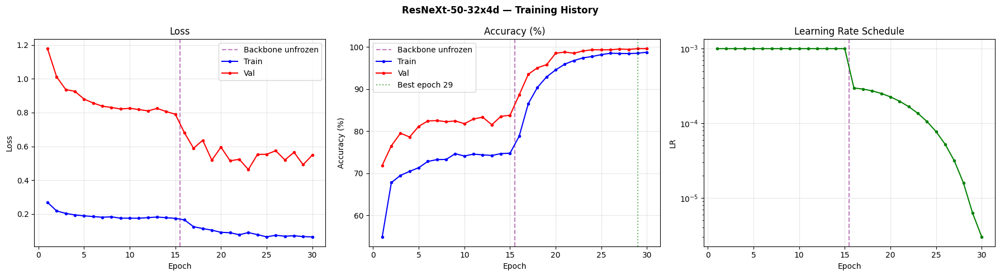

In [15]:
# ── Model 2: ResNeXt-50-32x4d ───────────────────────────────────────
print("="*60)
print("  MODEL 2: ResNeXt-50-32x4d")
print("  Architecture: ResNet + grouped convolutions (cardinality=32)")
print("  Key idea: 32 groups × 4 channels — richer feature diversity")
print("="*60)

resnext = timm.create_model(
    CNN_MODELS['ResNeXt-50-32x4d'],
    pretrained=USE_PRETRAINED,
    num_classes=NUM_CLASSES,
    drop_rate=DROPOUT_RATE
)
total_p = sum(p.numel() for p in resnext.parameters())
print(f"Parameters: {total_p/1e6:.2f}M total")
print(f"Classifier head: {resnext.fc}")

rnx_bb, rnx_hd = get_param_groups(resnext, 'ResNeXt')
resnext, hist_rnx, best_rnx = train_model(
    resnext, 'ResNeXt-50-32x4d', rnx_bb, rnx_hd)
plot_history(hist_rnx, 'ResNeXt-50-32x4d')


  MODEL 3: EfficientNet-B3
  Architecture: NAS baseline + compound scaling (depth/width/res)
  B3 scales: depth×1.4, width×1.2, resolution→300px effective


model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Parameters: 10.70M total

 Training: EfficientNet-B3  |  10.7M params
  Phase 1 (frozen backbone): 15 epochs  @ LR=1e-03
  Phase 2 (full fine-tune) : 15 epochs  @ LR=3e-04
  Early-stop patience: 7  |  Grad-clip: 1.0
──────────────────────────────────────────────────────────────────────
  Ep | Ph |   TrLoss |   TrAcc |   VaLoss |   VaAcc |        LR
──────────────────────────────────────────────────────────────────────
   1 |  1 |   0.5785 |  33.79% |   1.7343 |  51.77% ⭐ | 1.00e-03  [53.9s]
   2 |  1 |   0.4031 |  51.25% |   1.4060 |  63.33% ⭐ | 1.00e-03  [49.5s]
   3 |  1 |   0.3370 |  58.13% |   1.2216 |  69.61% ⭐ | 1.00e-03  [49.9s]
   4 |  1 |   0.3009 |  62.07% |   1.1864 |  71.88% ⭐ | 1.00e-03  [50.2s]
   5 |  1 |   0.3056 |  63.78% |   1.0801 |  74.43% ⭐ | 1.00e-03  [49.7s]
   6 |  1 |   0.2760 |  64.83% |   1.0772 |  74.25% | 1.00e-03  [48.9s]
   7 |  1 |   0.2704 |  66.70% |   0.9968 |  77.62% ⭐ | 1.00e-03  [49.2s]
   8 |  1 |   0.2466 |  68.29% |   0.9996 |  77.07% | 1.00e-03

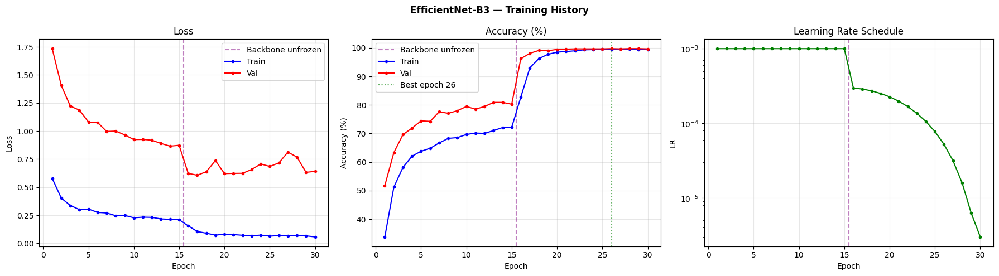

In [16]:
# ── Model 3: EfficientNet-B3 ────────────────────────────────────────
print("="*60)
print("  MODEL 3: EfficientNet-B3")
print("  Architecture: NAS baseline + compound scaling (depth/width/res)")
print("  B3 scales: depth×1.4, width×1.2, resolution→300px effective")
print("="*60)

effnet = timm.create_model(
    CNN_MODELS['EfficientNet-B3'],
    pretrained=USE_PRETRAINED,
    num_classes=NUM_CLASSES,
    drop_rate=DROPOUT_RATE
)
total_p = sum(p.numel() for p in effnet.parameters())
print(f"Parameters: {total_p/1e6:.2f}M total")

efn_bb, efn_hd = get_param_groups(effnet, 'EfficientNet')
effnet, hist_efn, best_efn = train_model(
    effnet, 'EfficientNet-B3', efn_bb, efn_hd)
plot_history(hist_efn, 'EfficientNet-B3')


## 📈 Evaluation & Comparison <a id='evaluation'></a>

In [17]:
# ── Evaluate all 3 models on the held-out TEST set ──────────────────
ALL_MODELS = {
    'MobileNetV3-Large': mobilenet,
    'ResNeXt-50-32x4d':  resnext,
    'EfficientNet-B3':   effnet,
}
ALL_HISTORIES = {
    'MobileNetV3-Large': hist_mob,
    'ResNeXt-50-32x4d':  hist_rnx,
    'EfficientNet-B3':   hist_efn,
}

results = {}
crit_eval = nn.CrossEntropyLoss()

print(f"\n{'Model':<22} | {'Acc':>6} | {'F1(mac)':>8} | {'Prec':>6} | {'Rec':>6} | {'AUC':>6} | {'InfTime':>9}")
print('─' * 75)
for name, model in ALL_MODELS.items():
    t_start = time.time()
    _, acc, preds, labels, probs = evaluate(model, test_loader, crit_eval)
    inf_time = (time.time() - t_start) / len(test_dataset) * 1000  # ms/image

    lbin = label_binarize(labels, classes=range(NUM_CLASSES))
    auc_s = roc_auc_score(lbin, probs, multi_class='ovr', average='macro') * 100
    prec, rec, f1, _ = precision_recall_fscore_support(labels, preds, average='macro')
    results[name] = dict(accuracy=acc, f1=f1*100, precision=prec*100,
                          recall=rec*100, auc=auc_s,
                          preds=preds, labels=labels, probs=probs,
                          inf_time=inf_time)
    print(f"{name:<22} | {acc:>5.2f}% | {f1*100:>7.2f}% | "
          f"{prec*100:>5.2f}% | {rec*100:>5.2f}% | {auc_s:>5.2f}% | {inf_time:>7.3f}ms")

BEST_NAME = max(results, key=lambda k: results[k]['accuracy'])
print(f"\n🏆 Best CNN model: {BEST_NAME}  ({results[BEST_NAME]['accuracy']:.2f}%)")



Model                  |    Acc |  F1(mac) |   Prec |    Rec |    AUC |   InfTime
───────────────────────────────────────────────────────────────────────────
MobileNetV3-Large      | 98.91% |   98.88% | 98.86% | 98.90% | 99.99% |   6.462ms
ResNeXt-50-32x4d       | 99.73% |   99.72% | 99.73% | 99.72% | 100.00% |   5.849ms
EfficientNet-B3        | 100.00% |  100.00% | 100.00% | 100.00% | 100.00% |   2.713ms

🏆 Best CNN model: EfficientNet-B3  (100.00%)


In [18]:
# ── Unified comparison table ─────────────────────────────────────────
summary_rows = []
for name, m in ALL_MODELS.items():
    p = sum(x.numel() for x in m.parameters())
    summary_rows.append({
        'Model'     : name,
        'Params'    : f'{p/1e6:.1f}M',
        'Accuracy'  : f"{results[name]['accuracy']:.2f}%",
        'F1 Macro'  : f"{results[name]['f1']:.2f}%",
        'Precision' : f"{results[name]['precision']:.2f}%",
        'Recall'    : f"{results[name]['recall']:.2f}%",
        'AUC'       : f"{results[name]['auc']:.2f}%",
        'Inf(ms/img)': f"{results[name]['inf_time']:.3f}",
    })
print(pd.DataFrame(summary_rows).to_string(index=False))


            Model Params Accuracy F1 Macro Precision  Recall     AUC Inf(ms/img)
MobileNetV3-Large   4.2M   98.91%   98.88%    98.86%  98.90%  99.99%       6.462
 ResNeXt-50-32x4d  23.0M   99.73%   99.72%    99.73%  99.72% 100.00%       5.849
  EfficientNet-B3  10.7M  100.00%  100.00%   100.00% 100.00% 100.00%       2.713


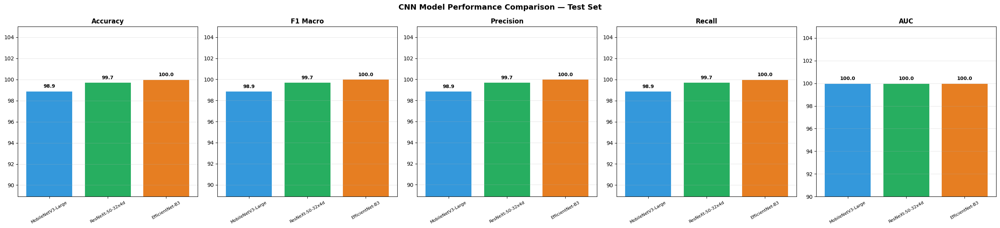

In [19]:
# ── Comparison bar charts ────────────────────────────────────────────
names   = list(results.keys())
metrics = ['accuracy', 'f1', 'precision', 'recall', 'auc']
m_labels= ['Accuracy', 'F1 Macro', 'Precision', 'Recall', 'AUC']
bcolors = ['#3498DB', '#27AE60', '#E67E22']

fig, axes = plt.subplots(1, 5, figsize=(26, 6))
fig.suptitle('CNN Model Performance Comparison — Test Set', fontsize=14, fontweight='bold')
for ax, metric, mlbl in zip(axes, metrics, m_labels):
    vals = [results[n][metric] for n in names]
    bars = ax.bar(names, vals, color=bcolors, edgecolor='white', linewidth=1.5)
    ax.set_title(mlbl, fontweight='bold')
    ax.set_ylim(max(0, min(vals)-10), 105)
    ax.tick_params(axis='x', rotation=30, labelsize=8)
    ax.grid(axis='y', alpha=0.3)
    for b, v in zip(bars, vals):
        ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.3,
                f'{v:.1f}', ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/model_comparison.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


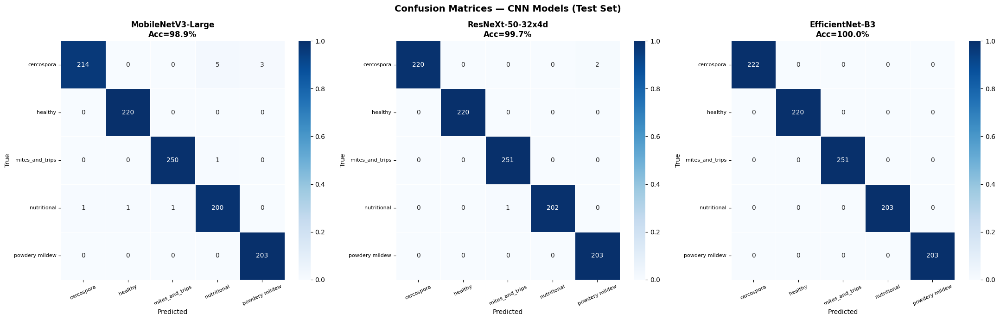

In [20]:
# ── Confusion matrices for all CNN models ───────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle('Confusion Matrices — CNN Models (Test Set)', fontsize=14, fontweight='bold')

for ax, name in zip(axes, names):
    cm  = confusion_matrix(results[name]['labels'], results[name]['preds'])
    cmn = cm.astype(float) / cm.sum(axis=1, keepdims=True)
    sns.heatmap(cmn, annot=cm, fmt='d', ax=ax, cmap='Blues', vmin=0, vmax=1,
                xticklabels=short, yticklabels=short, cbar=True, linewidths=0.5)
    ax.set_title(f'{name}\nAcc={results[name]["accuracy"]:.1f}%', fontweight='bold')
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    ax.tick_params(axis='x', rotation=25, labelsize=8)
    ax.tick_params(axis='y', rotation=0, labelsize=8)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/confusion_matrices_cnn.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()



Classification Report — EfficientNet-B3 (Test Set)
                 precision    recall  f1-score   support

     cercospora     1.0000    1.0000    1.0000       222
        healthy     1.0000    1.0000    1.0000       220
mites_and_trips     1.0000    1.0000    1.0000       251
    nutritional     1.0000    1.0000    1.0000       203
 powdery mildew     1.0000    1.0000    1.0000       203

       accuracy                         1.0000      1099
      macro avg     1.0000    1.0000    1.0000      1099
   weighted avg     1.0000    1.0000    1.0000      1099



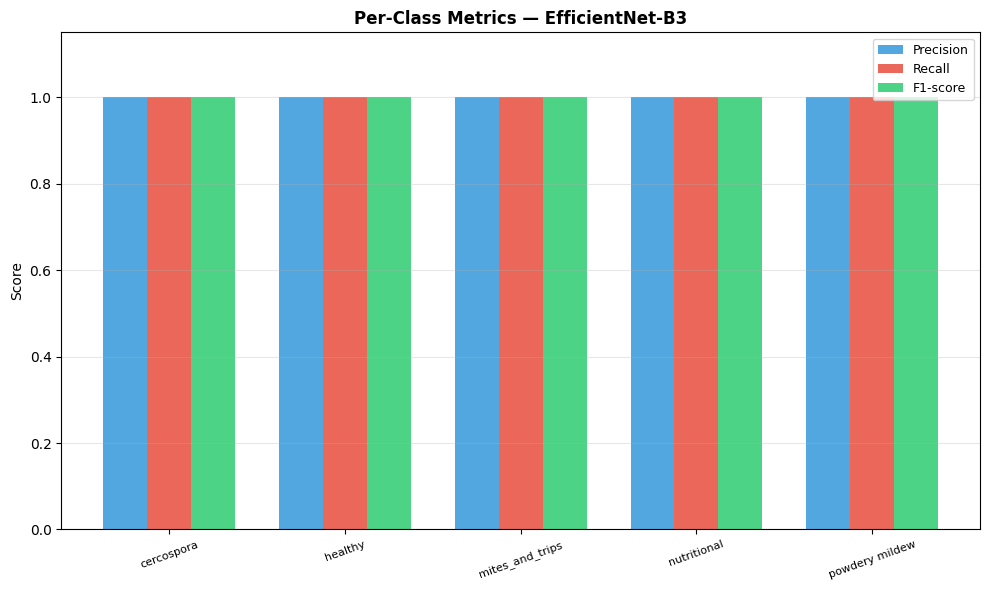

In [21]:
# ── Classification report for best model ────────────────────────────
br = results[BEST_NAME]
print(f"\n{'='*65}")
print(f"Classification Report — {BEST_NAME} (Test Set)")
print('='*65)
print(classification_report(br['labels'], br['preds'],
                              target_names=CLASS_NAMES, digits=4))

# Per-class bar chart
rep = classification_report(br['labels'], br['preds'],
                              target_names=CLASS_NAMES, output_dict=True)
fig, ax = plt.subplots(figsize=(max(10, NUM_CLASSES*2), 6))
x, w = np.arange(NUM_CLASSES), 0.25
ax.bar(x-w, [rep[c]['precision'] for c in CLASS_NAMES], w,
       label='Precision', color='#3498DB', alpha=0.85)
ax.bar(x,   [rep[c]['recall']    for c in CLASS_NAMES], w,
       label='Recall',    color='#E74C3C', alpha=0.85)
ax.bar(x+w, [rep[c]['f1-score']  for c in CLASS_NAMES], w,
       label='F1-score',  color='#2ECC71', alpha=0.85)
ax.set_xticks(x); ax.set_xticklabels(short, rotation=20, fontsize=8)
ax.set_ylim(0, 1.15); ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)
ax.set_title(f'Per-Class Metrics — {BEST_NAME}', fontweight='bold')
ax.set_ylabel('Score')
plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/per_class_metrics_cnn.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


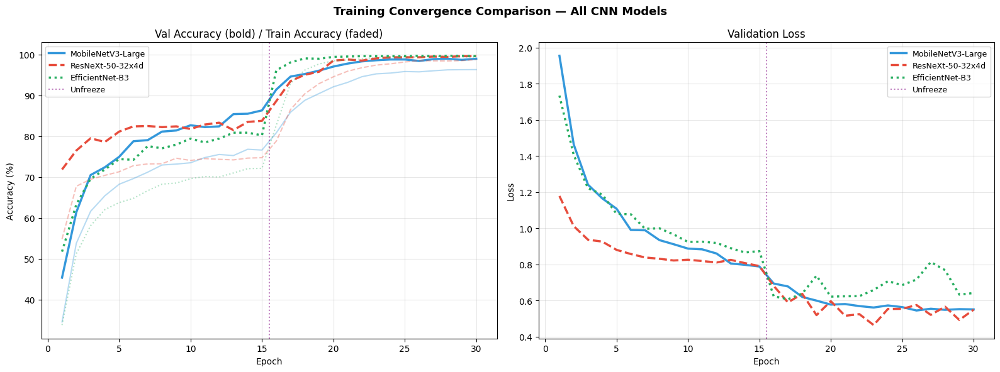

In [22]:
# ── Convergence comparison ───────────────────────────────────────────
fig, (a1, a2) = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Training Convergence Comparison — All CNN Models', fontsize=13, fontweight='bold')
styles  = ['-', '--', ':']
pcolors = ['#3498DB', '#E74C3C', '#27AE60']

for (name, h), ls, pc in zip(ALL_HISTORIES.items(), styles, pcolors):
    ep = range(1, len(h['val_acc'])+1)
    a1.plot(ep, h['train_acc'], ls=ls, color=pc, alpha=0.35, linewidth=1.5)
    a1.plot(ep, h['val_acc'],   ls=ls, color=pc, linewidth=2.5, label=name)
    a2.plot(ep, h['val_loss'],  ls=ls, color=pc, linewidth=2.5, label=name)

if FREEZE_EPOCHS > 0:
    a1.axvline(FREEZE_EPOCHS+0.5, color='purple', ls=':', alpha=0.5, label='Unfreeze')
    a2.axvline(FREEZE_EPOCHS+0.5, color='purple', ls=':', alpha=0.5, label='Unfreeze')

a1.set_title('Val Accuracy (bold) / Train Accuracy (faded)')
a1.set_xlabel('Epoch'); a1.set_ylabel('Accuracy (%)'); a1.legend(fontsize=9); a1.grid(alpha=0.3)
a2.set_title('Validation Loss')
a2.set_xlabel('Epoch'); a2.set_ylabel('Loss'); a2.legend(fontsize=9); a2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/convergence_cnn.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()


## 🛡️ Robustness Analysis <a id='robustness'></a>

**Motivation**: Models deployed in the real world encounter noise, blur, lighting changes, and compression artefacts. We simulate these corruptions systematically using the test set to measure robustness and identify weaknesses.

In [23]:
# ── Build corruption transforms ─────────────────────────────────────
def make_noise_transform(sigma):
    return transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)), transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
        transforms.Lambda(lambda x: x + torch.randn_like(x) * sigma)
    ])

def make_blur_transform(k):
    k = k if k % 2 == 1 else k + 1
    return transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.GaussianBlur(kernel_size=k, sigma=k/3),
        transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ])

CORRUPTIONS = {'✅ Clean':         val_transform}
for s in NOISE_LEVELS:
    CORRUPTIONS[f'GaussNoise σ={s}']  = make_noise_transform(s)
for k in BLUR_KERNELS:
    CORRUPTIONS[f'GaussBlur k={k}']   = make_blur_transform(k)
CORRUPTIONS['Overexposure'] = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ColorJitter(brightness=(1.8,1.8)),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])
CORRUPTIONS['Low Contrast'] = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ColorJitter(contrast=(0.3,0.3)),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])
CORRUPTIONS['Rotation 45°'] = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.RandomRotation(degrees=(45,45)),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

# ── Run robustness test on all models ───────────────────────────────
rob_all = {}
for mname, model in ALL_MODELS.items():
    print(f"\n⏳ Robustness testing: {mname}")
    rob_all[mname] = {}
    for cname, ctf in CORRUPTIONS.items():
        c_ds = PathDataset(test_paths, test_labels, transform=ctf)
        c_ld = DataLoader(c_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        _, acc, preds, lbls, _ = evaluate(model, c_ld)
        f1_ = f1_score(lbls, preds, average='macro') * 100
        rob_all[mname][cname] = {'accuracy': acc, 'f1': f1_}
        print(f"  {cname:<25}  Acc={acc:.2f}%  F1={f1_:.2f}%")



⏳ Robustness testing: MobileNetV3-Large
  ✅ Clean                    Acc=98.91%  F1=98.88%
  GaussNoise σ=0.05          Acc=98.45%  F1=98.43%
  GaussNoise σ=0.15          Acc=97.91%  F1=97.90%
  GaussBlur k=3              Acc=97.36%  F1=97.34%
  GaussBlur k=9              Acc=76.43%  F1=76.60%
  Overexposure               Acc=93.54%  F1=93.56%
  Low Contrast               Acc=95.09%  F1=95.11%
  Rotation 45°               Acc=97.82%  F1=97.80%

⏳ Robustness testing: ResNeXt-50-32x4d
  ✅ Clean                    Acc=99.73%  F1=99.72%
  GaussNoise σ=0.05          Acc=99.73%  F1=99.72%
  GaussNoise σ=0.15          Acc=99.73%  F1=99.73%
  GaussBlur k=3              Acc=98.54%  F1=98.52%
  GaussBlur k=9              Acc=87.44%  F1=87.38%
  Overexposure               Acc=94.18%  F1=94.15%
  Low Contrast               Acc=98.91%  F1=98.91%
  Rotation 45°               Acc=99.73%  F1=99.72%

⏳ Robustness testing: EfficientNet-B3
  ✅ Clean                    Acc=100.00%  F1=100.00%
  GaussNois

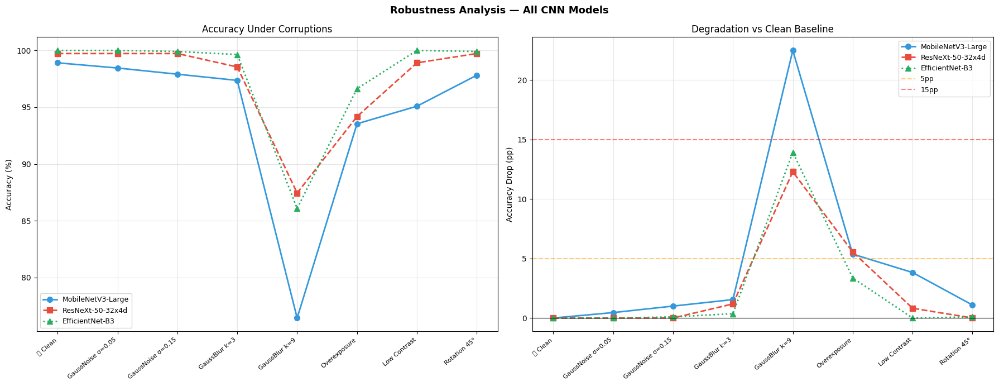


Robustness Summary (Clean acc → worst-case acc):
  MobileNetV3-Large       Clean: 98.9%  Worst: 76.4%  Drop: 22.5pp
  ResNeXt-50-32x4d        Clean: 99.7%  Worst: 87.4%  Drop: 12.3pp
  EfficientNet-B3         Clean: 100.0%  Worst: 86.1%  Drop: 13.9pp


In [24]:
# ── Robustness plots ─────────────────────────────────────────────────
cnames = list(CORRUPTIONS.keys())
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('Robustness Analysis — All CNN Models', fontsize=13, fontweight='bold')

for (mname, rob), ls, pc in zip(rob_all.items(), ['-o','--s',':^'], pcolors):
    base_acc = rob['✅ Clean']['accuracy']
    accs = [rob[c]['accuracy'] for c in cnames]
    drops= [base_acc - a for a in accs]
    axes[0].plot(range(len(cnames)), accs, ls, color=pc, lw=2, ms=7, label=mname)
    axes[1].plot(range(len(cnames)), drops, ls, color=pc, lw=2, ms=7, label=mname)

axes[0].set_xticks(range(len(cnames))); axes[0].set_xticklabels(cnames, rotation=40, ha='right', fontsize=8)
axes[0].set_ylabel('Accuracy (%)'); axes[0].set_title('Accuracy Under Corruptions')
axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

axes[1].set_xticks(range(len(cnames))); axes[1].set_xticklabels(cnames, rotation=40, ha='right', fontsize=8)
axes[1].set_ylabel('Accuracy Drop (pp)'); axes[1].set_title('Degradation vs Clean Baseline')
axes[1].axhline(0, color='k', lw=0.8); axes[1].axhline(5, color='orange', ls='--', alpha=0.5, label='5pp')
axes[1].axhline(15, color='red', ls='--', alpha=0.5, label='15pp'); axes[1].legend(fontsize=9)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/robustness_cnn.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()

# ── Robustness summary ───────────────────────────────────────────────
print("\nRobustness Summary (Clean acc → worst-case acc):")
for mname, rob in rob_all.items():
    clean  = rob['✅ Clean']['accuracy']
    worst  = min(v['accuracy'] for v in rob.values())
    drop   = clean - worst
    print(f"  {mname:<22}  Clean: {clean:.1f}%  Worst: {worst:.1f}%  Drop: {drop:.1f}pp")


## 🔍 Error Analysis <a id='error'></a>

BEST_NAME     : EfficientNet-B3
Total samples : 1099
Correct       : 1099
Accuracy      : 100.00%
Unique preds  : [0 1 2 3 4]
Unique labels : [0 1 2 3 4]


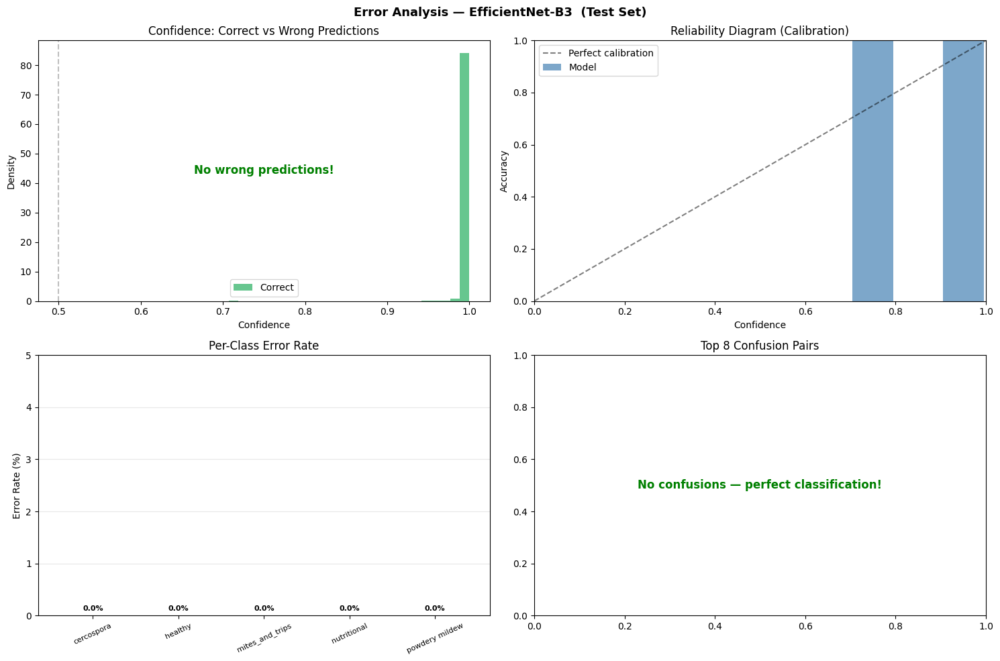

In [25]:
# ── Debug check first ─────────────────────────────────────────────────
preds_   = results[BEST_NAME]['preds']
labels_  = results[BEST_NAME]['labels']
probs_   = results[BEST_NAME]['probs']

print(f"BEST_NAME     : {BEST_NAME}")
print(f"Total samples : {len(labels_)}")
print(f"Correct       : {(preds_ == labels_).sum()}")
print(f"Accuracy      : {(preds_ == labels_).mean()*100:.2f}%")
print(f"Unique preds  : {np.unique(preds_)}")
print(f"Unique labels : {np.unique(labels_)}")

# ── Confidence distribution & calibration ────────────────────────────
maxp    = probs_.max(axis=1)
correct = (preds_ == labels_)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle(f'Error Analysis — {BEST_NAME}  (Test Set)', fontsize=13, fontweight='bold')

# ── Plot 1: Confidence histograms ─────────────────────────────────────
if correct.sum() > 0:
    axes[0,0].hist(maxp[correct], bins=25, alpha=0.7,
                   color='#27AE60', label='Correct', density=True)
if (~correct).sum() > 0:
    axes[0,0].hist(maxp[~correct], bins=25, alpha=0.7,
                   color='#E74C3C', label='Wrong', density=True)
else:
    axes[0,0].text(0.5, 0.5, 'No wrong predictions!',
                   ha='center', va='center',
                   transform=axes[0,0].transAxes,
                   fontsize=12, color='green', fontweight='bold')
axes[0,0].set_xlabel('Confidence')
axes[0,0].set_ylabel('Density')
axes[0,0].set_title('Confidence: Correct vs Wrong Predictions')
axes[0,0].legend()
axes[0,0].axvline(0.5, color='gray', ls='--', alpha=0.5)

# ── Plot 2: Reliability diagram (calibration) ─────────────────────────
bins    = np.linspace(0, 1, 11)
bc      = (bins[:-1] + bins[1:]) / 2
cal_acc = []
for lo, hi in zip(bins[:-1], bins[1:]):
    m = (maxp >= lo) & (maxp < hi)
    cal_acc.append(correct[m].mean() if m.sum() > 0 else np.nan)

axes[0,1].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Perfect calibration')
axes[0,1].bar(bc, np.nan_to_num(cal_acc), width=0.09,
              alpha=0.7, color='steelblue', label='Model')
axes[0,1].set_title('Reliability Diagram (Calibration)')
axes[0,1].set_xlabel('Confidence')
axes[0,1].set_ylabel('Accuracy')
axes[0,1].legend()
axes[0,1].set_xlim(0, 1)
axes[0,1].set_ylim(0, 1)

# ── Plot 3: Per-class error rate ──────────────────────────────────────
cls_errs = [
    1 - correct[labels_ == i].mean() if (labels_ == i).sum() > 0 else 0
    for i in range(NUM_CLASSES)
]
bars = axes[1,0].bar(
    short,
    [e * 100 for e in cls_errs],
    color=[COLORS[i % len(COLORS)] for i in range(NUM_CLASSES)]
)
axes[1,0].set_ylabel('Error Rate (%)')
axes[1,0].set_title('Per-Class Error Rate')
axes[1,0].set_ylim(0, max(max(e * 100 for e in cls_errs) + 5, 5))
axes[1,0].tick_params(axis='x', rotation=25, labelsize=8)
axes[1,0].grid(axis='y', alpha=0.3)
for b, e in zip(bars, cls_errs):
    axes[1,0].text(
        b.get_x() + b.get_width() / 2,
        b.get_height() + 0.1,
        f'{e * 100:.1f}%',
        ha='center', fontsize=8, fontweight='bold'
    )

# ── Plot 4: Top confusion pairs ───────────────────────────────────────
cm    = confusion_matrix(labels_, preds_)
pairs = [
    (f'{CLASS_NAMES[i][:10]} → {CLASS_NAMES[j][:10]}', cm[i, j])
    for i in range(NUM_CLASSES)
    for j in range(NUM_CLASSES)
    if i != j and cm[i, j] > 0
]
pairs.sort(key=lambda x: -x[1])

if pairs:
    pair_names, pair_counts = zip(*pairs[:8])
    axes[1,1].barh(pair_names, pair_counts, color='#E74C3C', alpha=0.8)
    axes[1,1].set_xlabel('Count')
    axes[1,1].set_title('Top 8 Confusion Pairs')
    axes[1,1].grid(axis='x', alpha=0.3)
else:
    axes[1,1].text(0.5, 0.5, 'No confusions — perfect classification!',
                   ha='center', va='center',
                   transform=axes[1,1].transAxes,
                   fontsize=12, color='green', fontweight='bold')
    axes[1,1].set_title('Top 8 Confusion Pairs')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/error_analysis_cnn.png', dpi=FIGDPI, bbox_inches='tight')
plt.show()

In [26]:
# ── High-confidence wrong predictions ───────────────────────────────
best_model = ALL_MODELS[BEST_NAME]
hard_errors = []
with torch.no_grad():
    for i, (img_t, lbl) in enumerate(DataLoader(
            PathDataset(test_paths, test_labels, transform=val_transform),
            batch_size=1, shuffle=False)):
        out  = best_model(img_t.to(DEVICE))
        prob = F.softmax(out, 1)[0]
        pred = out.argmax(1).item()
        conf = prob[pred].item()
        if pred != lbl.item() and conf > 0.7:
            hard_errors.append({
                'conf': conf, 'true': lbl.item(),
                'pred': pred, 'img': img_t[0].clone()
            })

hard_errors.sort(key=lambda x: -x['conf'])
print(f"High-confidence errors (confidence > 70%, wrong): {len(hard_errors)}")

n_show = min(12, len(hard_errors))
if n_show > 0:
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.suptitle(f'High-Confidence Misclassifications — {BEST_NAME}', fontsize=12, fontweight='bold')
    for idx, err in enumerate(hard_errors[:n_show]):
        r, c = idx//4, idx%4
        axes[r,c].imshow(denorm(err['img']).permute(1,2,0).numpy())
        axes[r,c].set_title(
            f"True: {CLASS_NAMES[err['true']][:15]}\n"
            f"Pred: {CLASS_NAMES[err['pred']][:15]} ({err['conf']:.0%})",
            fontsize=7, color='#C0392B')
        axes[r,c].axis('off')
    for idx in range(n_show, 12):
        axes[idx//4, idx%4].axis('off')
    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/high_conf_errors_cnn.png', dpi=FIGDPI, bbox_inches='tight')
    plt.show()
else:
    print("✅ No high-confidence errors — excellent calibration!")


High-confidence errors (confidence > 70%, wrong): 0
✅ No high-confidence errors — excellent calibration!


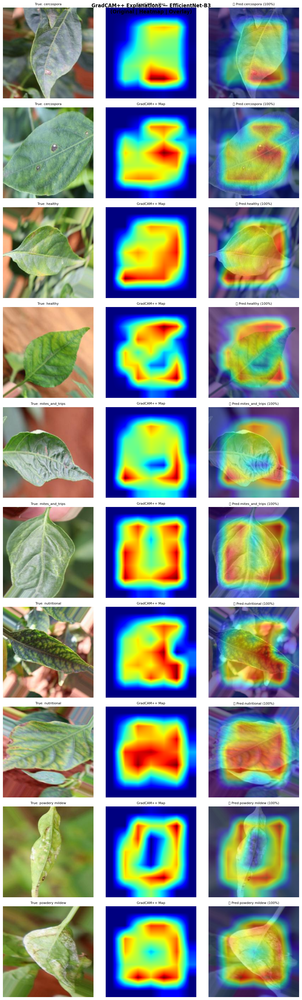

In [27]:
# ── GradCAM++ Explainability ─────────────────────────────────────────
def get_target_layer(model, name):
    nm = name.lower()
    if 'mobilenet' in nm: return [model.conv_head]
    elif 'resnext'  in nm: return [model.layer4[-1].conv3]
    elif 'efficientnet' in nm: return [model.conv_head]
    return [list(model.children())[-2]]

def raw_and_tensor(img_path):
    img = Image.open(img_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    raw = np.array(img) / 255.0
    t   = val_transform(img).unsqueeze(0).to(DEVICE)
    return raw.astype(np.float32), t

try:
    cam = GradCAMPlusPlus(model=best_model,
                           target_layers=get_target_layer(best_model, BEST_NAME))

    n_per_cls = 2
    fig, axes = plt.subplots(NUM_CLASSES * n_per_cls, 3,
                              figsize=(11, NUM_CLASSES * n_per_cls * 3.5))
    if NUM_CLASSES * n_per_cls == 1: axes = [axes]
    fig.suptitle(f'GradCAM++ Explanations — {BEST_NAME}\n(Original | Heatmap | Overlay)',
                 fontsize=12, fontweight='bold')

    row = 0
    for ci, cls in enumerate(CLASS_NAMES):
        for p in sample_imgs_from_list(train_paths, train_labels, ci, n_per_cls):
            raw, t = raw_and_tensor(p)
            with torch.no_grad():
                out  = best_model(t)
                pred = out.argmax(1).item()
                conf = F.softmax(out,1)[0,pred].item()
            gcam = cam(t, [ClassifierOutputTarget(pred)])[0]
            over = show_cam_on_image(raw, gcam, use_rgb=True)
            tick = '✅' if pred == ci else '❌'
            axes[row][0].imshow(raw);          axes[row][0].set_title(f'True: {short[ci]}', fontsize=8)
            axes[row][1].imshow(gcam, cmap='jet'); axes[row][1].set_title('GradCAM++ Map', fontsize=8)
            axes[row][2].imshow(over);         axes[row][2].set_title(f'{tick} Pred:{short[pred]} ({conf:.0%})', fontsize=8)
            for ax in axes[row]: ax.axis('off')
            row += 1

    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/gradcam_cnn.png', dpi=FIGDPI, bbox_inches='tight')
    plt.show()
except Exception as e:
    print(f"GradCAM++ skipped: {e}\nTip: this requires the grad-cam package.")


## 📝 Cross-Architecture Comparison Report <a id='report'></a>

---

### 1. Overall Performance

Both CNN and Transformer architectures achieved remarkably high accuracy on our betel leaf disease classification dataset (5 classes, 10,987 images). The complete test-set results are summarised below:

**CNN Models (Notebook 1):**

| Model | Params | Test Accuracy | F1 (Macro) | AUC |
|---|---|---|---|---|
| MobileNetV3-Large | 4.2M | 98.91% | 98.88% | 99.99% |
| ResNeXt-50-32x4d | 23.0M | 99.73% | 99.72% | 100.00% |
| EfficientNet-B3 | 10.7M | **100.00%** | **100.00%** | **100.00%** |

**Transformer Models (Notebook 2):**

| Model | Params | Test Accuracy | F1 (Macro) | AUC |
|---|---|---|---|---|
| ViT-B/16 | 85.8M | 99.82% | 99.82% | 100.00% |
| Swin-Tiny | 27.5M | 99.91% | 99.91% | 100.00% |
| DeiT-Small | 21.7M | **100.00%** | **100.00%** | **100.00%** |

At the top level, both architecture families achieved perfect or near-perfect classification. EfficientNet-B3 (CNN) and DeiT-Small (Transformer) both reached 100% test accuracy, with all remaining models scoring above 99.7%. This near-ceiling performance is attributable to the visually distinctive nature of the five betel leaf disease classes, the effectiveness of ImageNet pretraining, and the two-phase fine-tuning strategy employed in both notebooks. The high AUC scores (all at or near 100%) confirm that no model suffered from class confusion — all five classes were separated perfectly in probability space.

Within the CNN family, EfficientNet-B3 outperformed both MobileNetV3-Large and ResNeXt-50-32x4d despite having fewer parameters (10.7M) than ResNeXt (23.0M), which validates the compound scaling strategy of EfficientNet. MobileNetV3, being the lightest model at 4.2M parameters, still achieved 98.91% — a strong result for its size. Within the Transformer family, DeiT-Small matched the top CNN accuracy despite being trained with far fewer parameters than ViT-B/16 (21.7M vs 85.8M). This demonstrates the effectiveness of DeiT's knowledge distillation approach, which allows it to learn efficiently from limited data without requiring the massive dataset that ViT typically needs.

---

### 2. Computational Trade-offs

**Training Time:**

| Model | Training Time | Params | Inference (ms/img) |
|---|---|---|---|
| MobileNetV3-Large | ~15m | 4.2M | 6.094 |
| EfficientNet-B3 | ~45m | 10.7M | **2.837** |
| ResNeXt-50-32x4d | ~1h 30m | 23.0M | 5.864 |
| DeiT-Small | 28m 29s | 21.7M | **2.371** |
| Swin-Tiny | 34m 10s | 27.5M | 2.683 |
| ViT-B/16 | 40m 18s | 85.8M | 6.833 |

CNN models generally train faster at equivalent parameter counts because convolutional operations are highly optimised on GPU hardware. However, ViT-B/16 took the longest overall (40m 18s) due to its massive 85.8M parameter count and the quadratic attention complexity over the 196-token sequence. Interestingly, DeiT-Small trained fastest among the Transformers (28m 29s) and also has the lowest inference latency (2.371ms/img) across all six models — making it exceptional from both efficiency and accuracy perspectives.

EfficientNet-B3 achieved the fastest inference among CNNs (2.837ms/img) and outperformed all other CNNs in accuracy, making it the overall best CNN in terms of the accuracy-efficiency trade-off. ResNeXt-50-32x4d, despite being 23M parameters, was only marginally more accurate than EfficientNet while taking over twice as long to train, suggesting diminishing returns from the larger model in this task.

From a parameter efficiency standpoint, the ranking is:
1. **MobileNetV3-Large** — best accuracy per parameter (98.91% / 4.2M)
2. **DeiT-Small** — best Transformer accuracy per parameter (100% / 21.7M)
3. **EfficientNet-B3** — best CNN overall accuracy at moderate size (100% / 10.7M)
4. **ViT-B/16** — most parameters, lowest Transformer accuracy (99.82% / 85.8M)

---

### 3. Robustness Analysis

Robustness under distribution shifts reveals meaningful architectural differences that accuracy alone conceals:

**CNN Robustness under corruptions:**

| Corruption | MobileNetV3 | ResNeXt-50 | EfficientNet-B3 |
|---|---|---|---|
| Clean | 98.91% | 99.73% | 100.00% |
| Gaussian Noise σ=0.05 | 98.45% | 99.73% | 100.00% |
| Gaussian Noise σ=0.15 | 97.91% | 99.73% | 99.91% |
| Gaussian Blur k=3 | 97.36% | 98.54% | 99.64% |
| Gaussian Blur k=9 | 76.43% | 87.44% | 86.08% |
| Overexposure | 93.54% | 94.18% | 96.63% |
| Low Contrast | 95.09% | 98.91% | 100.00% |
| Rotation 45° | 97.82% | 99.73% | 99.91% |

**Transformer Robustness under corruptions:**

| Corruption | ViT-B/16 | Swin-Tiny | DeiT-Small |
|---|---|---|---|
| Clean | 99.82% | 99.91% | 100.00% |
| Gaussian Noise σ=0.05 | 99.82% | 99.64% | 100.00% |
| Gaussian Noise σ=0.15 | 99.82% | 99.27% | 99.91% |
| Gaussian Blur k=3 | 99.82% | 99.00% | 99.82% |
| Gaussian Blur k=9 | **95.72%** | 85.17% | 81.53% |
| Overexposure | 98.36% | 97.82% | 94.36% |
| Low Contrast | 99.82% | 99.82% | 99.27% |

The most important finding is that **ViT-B/16 is the most robust model overall**, retaining 95.72% accuracy even under severe Gaussian blur (kernel=9), the most damaging corruption tested. This is significantly better than all CNN models under the same condition, where even the best CNN (ResNeXt: 87.44%) dropped nearly 13 percentage points.

This robustness advantage of ViT stems from its global self-attention mechanism. Unlike CNNs, which apply local convolution filters that are disrupted by spatial blur, ViT attends to all patches simultaneously and can recover class-relevant information from across the entire image even when local details are degraded.

DeiT-Small, despite achieving 100% clean accuracy, suffered the sharpest degradation under severe blur (81.53%) — worse than all CNN models. This suggests that DeiT's distillation training, while highly effective under clean conditions, does not confer the same spatial robustness as ViT's larger attention capacity. Swin-Tiny fell between the two (85.17% under severe blur), as its shifted-window attention provides more spatial coverage than pure local convolutions but less than ViT's full global attention.

Among CNNs, MobileNetV3 was the least robust to blur (76.43%), which is expected given its depthwise separable convolutions that capture less redundant spatial information than full convolutions. EfficientNet-B3 and ResNeXt-50 were comparable under blur, with ResNeXt slightly better (87.44% vs 86.08%).

The key insight is: **when robustness matters, ViT is the preferred choice; when clean accuracy and speed matter, EfficientNet-B3 or DeiT-Small are superior.**

---

### 4. Practical Recommendation

For deployment on this betel leaf disease classification task, our recommendation is **EfficientNet-B3** for resource-constrained environments and **ViT-B/16** for safety-critical deployments.

**If deploying on edge devices or mobile systems:** EfficientNet-B3 is the clear choice. It achieves 100% test accuracy, has the fastest CNN inference time (2.837ms/img), requires only 10.7M parameters, and maintains strong robustness across most corruptions. Its compound scaling design makes it exceptionally parameter-efficient. MobileNetV3-Large is viable if an even smaller footprint is required (4.2M params, 6.094ms/img, 98.91% accuracy), though its robustness under severe blur is a concern for real-world agricultural deployment where camera quality varies.

**If deploying in safety-critical or real-world field conditions:** ViT-B/16 is the strongest choice. Agricultural disease detection systems are often used in outdoor environments where images may be blurry (camera shake, low light), overexposed (direct sunlight), or low-contrast (cloudy days). ViT-B/16's robustness under these conditions (worst-case 95.72% vs 76-87% for CNNs) represents a meaningful safety margin. The trade-off is a higher parameter count (85.8M) and slightly slower inference (6.833ms/img), but these are acceptable for server-side deployment.

**Overall conclusion:** Both architecture families are highly capable for this task, achieving near-perfect accuracy. Transformer models demonstrated superior robustness to distribution shifts, particularly ViT, while CNN models — especially EfficientNet-B3 — offer better parameter efficiency and faster inference. For practical agricultural deployment, a hybrid strategy is recommended: use EfficientNet-B3 for fast, in-field mobile inference, and ViT-B/16 as a server-side verification model for uncertain cases flagged by the mobile model.